In [1]:
import numpy as np
import scipy as sp
import suite2p as s2p
import TwoPUtils
import os
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import pickle

%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
write_folder = os.path.join('/mnt','BigDisk','2P_scratch')


mouse = '4467975.2'

file_list = ({'date': '28_09_2020', 'scene':'YMaze_LNovel','session':3,'scan':8},
             {'date': '29_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '30_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':4},
             {'date': '01_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':4},
             {'date': '02_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':9},
             {'date': '03_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':8},
             {'date': '04_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':2},
             {'date': '04_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':5},
             {'date': '05_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':3},
             {'date': '06_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':5},
             {'date': '06_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':8},
             )

In [3]:
def get_scan_lengths(file_list):
    max_frame = []
    for f in file_list:
        print(f)
        scan_str = "%s_%03d_%03d" % (f['scene'],f['session'],f['scan'])
        try:
            source_folder  = os.path.join('/media','mplitt','Backup Plus3','2P_Data')
            source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
            info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')
        except:
            source_folder  = os.path.join('/media','mplitt','Backup Plus4','2P_Data')
            source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
            info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')
            
        max_frame.append(info['max_idx'])
        

        
    return np.cumsum([0, *max_frame])

In [4]:
max_frames = get_scan_lengths(file_list)

{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 9}
{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8}
{'date': '04_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2}
{'date': '04_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 5}
{'date': '05_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 3}
{'date': '06_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 5}
{'date': '06_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 8}


In [5]:
# load ops
s2p_dir = os.path.join("/mnt/BigDisk/2P_scratch/",mouse,"YMazeAll","suite2p","plane0")
ops = np.load(os.path.join("/mnt/BigDisk/2P_scratch/",mouse,"YMazeAll","suite2p","plane0","ops.npy"),allow_pickle=True).all()


# make sure total length is same as binary file
assert max_frames[-1]==ops['nframes'], "scan numbers not equal"

In [6]:
# load suite2p results
print(ops['save_path0'])
F = np.load(os.path.join(s2p_dir,"F.npy"))
Fneu = np.load(os.path.join(s2p_dir,"Fneu.npy"))
spks = np.load(os.path.join(s2p_dir,"spks.npy"))
F_chan2 = np.load(os.path.join(s2p_dir,"F_chan2.npy"))
Fneu_chan2 = np.load(os.path.join(s2p_dir,"Fneu_chan2.npy"))
stat = np.load(os.path.join(s2p_dir,"stat.npy"),allow_pickle=True)
iscell = np.load(os.path.join(s2p_dir,"iscell.npy"))


# load aligned binary for combined data
binfile = s2p.io.binary.BinaryFile(ops['Ly'],ops['Lx'],ops['reg_file'])
binfile_chan2 = s2p.io.binary.BinaryFile(ops['Ly'],ops['Lx'],ops['reg_file_chan2'])


/mnt/BigDisk/2P_scratch/4467975.2/YMazeAll


In [ ]:

if os.path.exists(os.path.join(s2p_dir,"file_info.pkl")):
    with open(os.path.join(s2p_dir,"file_info.pkl"),'rb') as _file:
        file_list = pickle.load(_file)
    
    keep_list= np.load(os.path.join(s2p_dir,"keep.npy"))

else:
    batch_size = 8000
    # for each session

    for i, (file, first_i,last_i) in enumerate(zip(file_list,max_frames[:-1],max_frames[1:])):

        print(file,first_i,last_i)


        mean = np.zeros(ops['meanImg'].shape)
        denom = 0
        mean_chan2 = np.zeros(ops['meanImg'].shape)

        maxproj = np.zeros(ops['meanImg'].shape)
        maxproj_chan2 = np.zeros(ops['meanImg'].shape)

        counter = 0
        k = first_i
        while k<last_i:
            print('k',k)
            inds = np.arange(k,min(k+batch_size,last_i))
            frames = binfile.ix(inds)
            frames_chan2 = binfile_chan2.ix(inds)

            mean += frames.mean(axis=0)
            mean_chan2 += frames_chan2.mean(axis=0)
            denom += 1

            maxproj = np.maximum(maxproj,np.percentile(frames,95,axis=0))
            maxproj_chan2 = np.maximum(maxproj_chan2,np.percentile(frames_chan2,95,axis=0))

            k+=batch_size

        mean/=denom
        mean_chan2/=denom

        file['start_index'], file['stop_index'] = first_i, last_i
        file['mean'],file['mean_chan2'], file['maxproj'], file['maxproj_chan2'] = mean, mean_chan2, maxproj, maxproj_chan2


        # get mean image for both channels

        # get max projection for both channels
    with open(os.path.join(s2p_dir,"file_info.pkl"),'wb') as _file:
        pickle.dump(file_list,_file)    
    keep_list = np.zeros([stat.shape[0],2])
    np.save(os.path.join(s2p_dir,"keep.npy"),keep_list)

{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8} 0 33472
k 0
k 8000
k 16000
k 24000


In [17]:
def get_input(n,N):
    keep = input("Keep ROI %d of %d? (y=1/n=0)" % (n,N))
    if keep in ("1"):
        return 1
    elif keep in ("0"):
        return 0
    else:
        print("invalid input")
        get_input()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


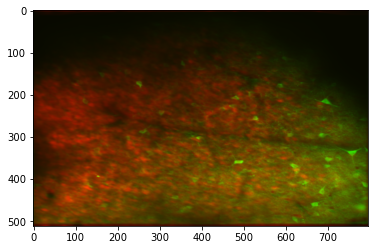

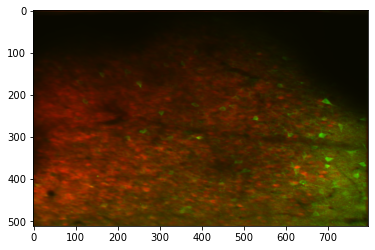

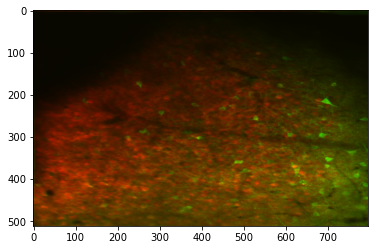

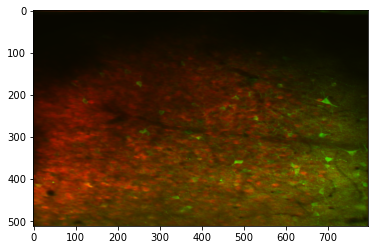

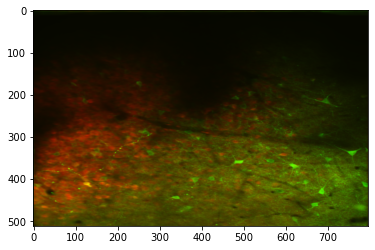

...

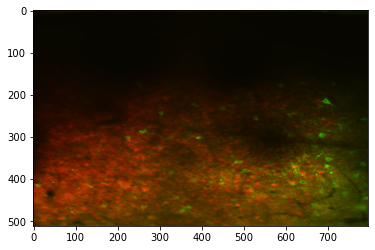

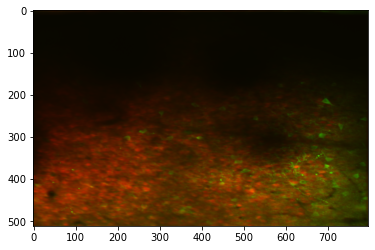

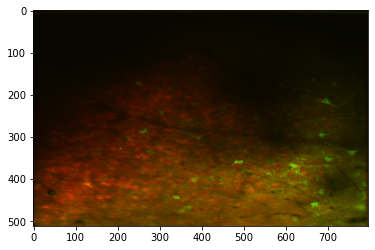

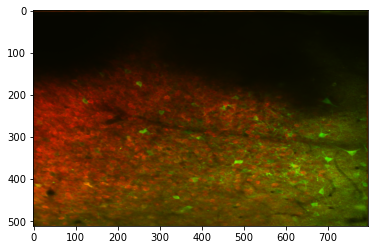

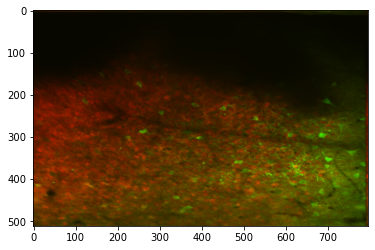

In [20]:
np.save(os.path.join(s2p_dir,"keep.npy"),keep_list)
for i, file in enumerate(file_list):
    mean,maxproj,mean_chan2,maxproj_chan2 = file['mean'],file['maxproj'],file['mean_chan2'],file['maxproj_chan2']
    color_img = np.zeros([*mean.shape,3])
    color_img[:,:,0]=mean_chan2/np.amax(mean_chan2)
    color_img[:,:,1]=mean/np.amax(mean)
    f,ax = plt.subplots()
    ax.imshow(color_img)

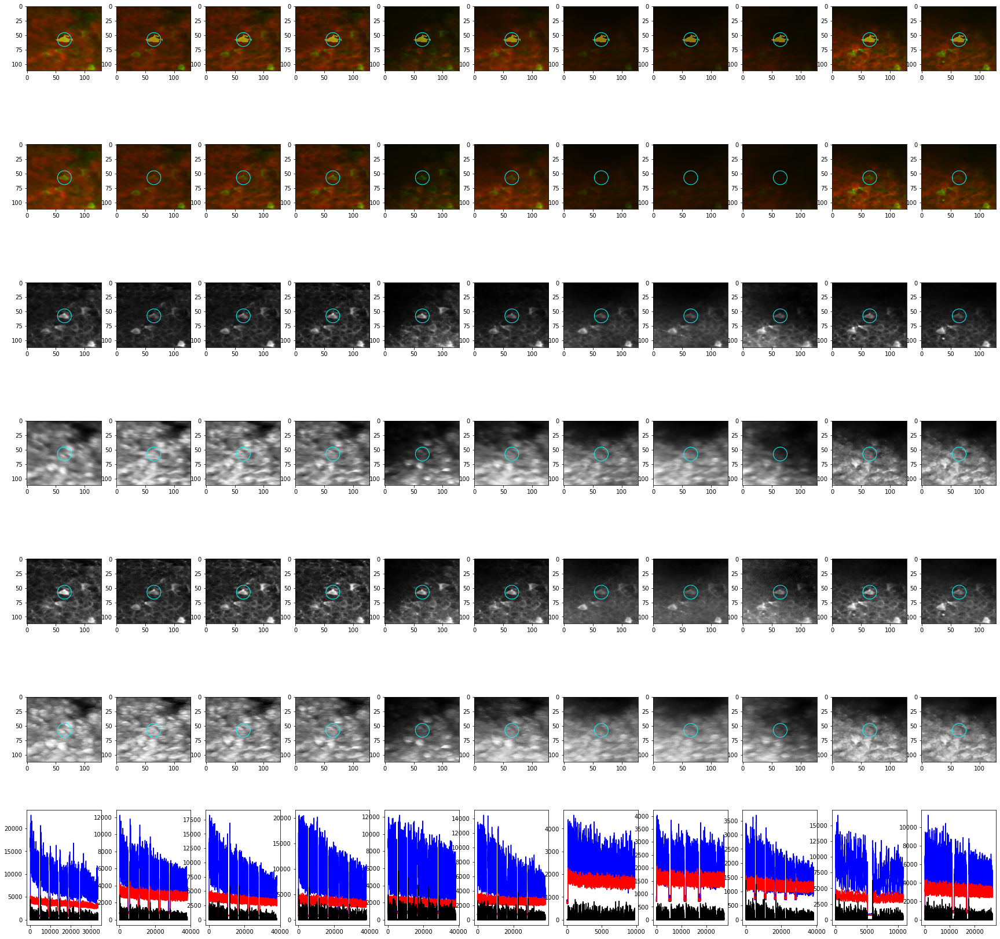

Keep ROI 25 of 527? (y=1/n=0) 0


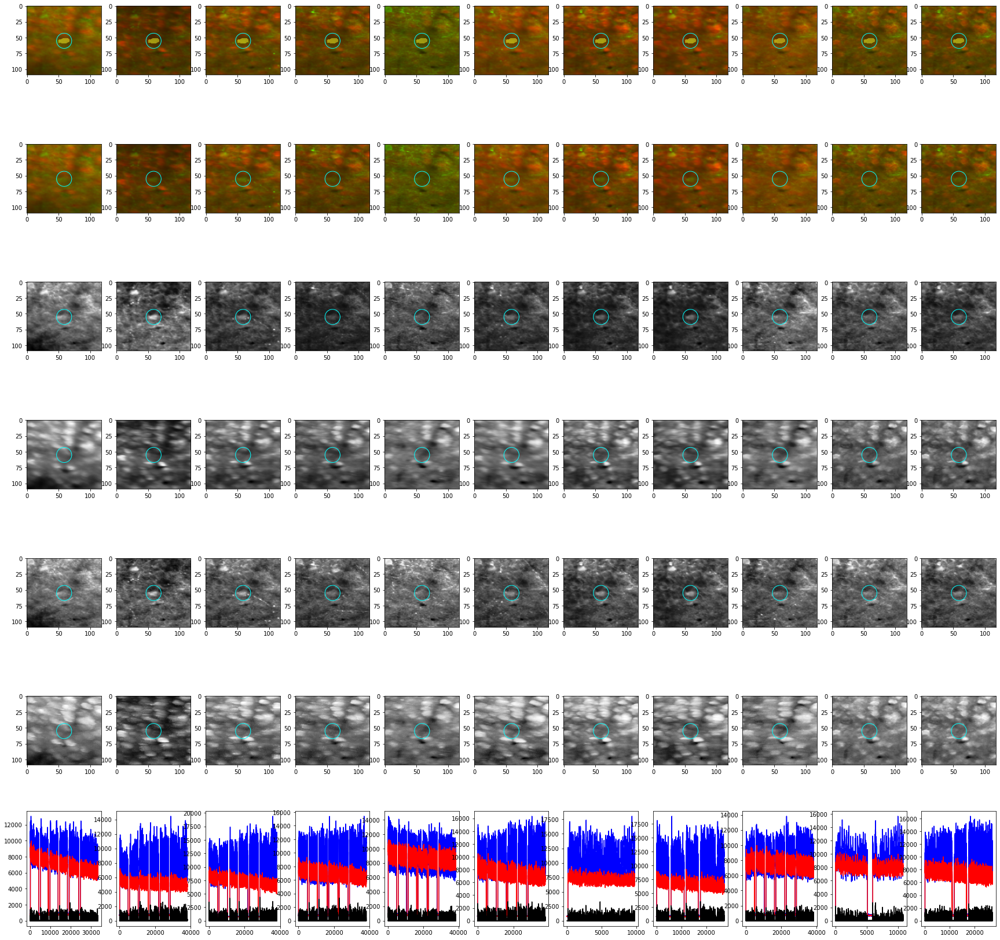

Keep ROI 26 of 527? (y=1/n=0) 0


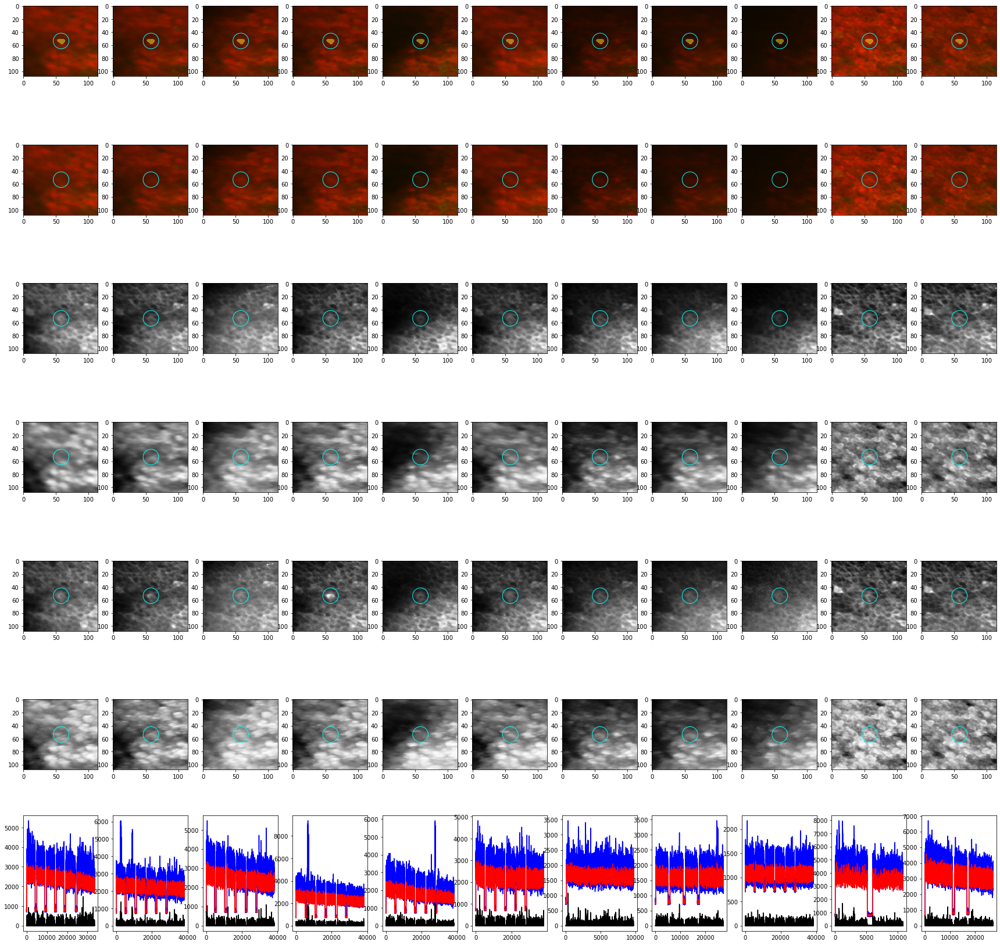

Keep ROI 27 of 527? (y=1/n=0) 1


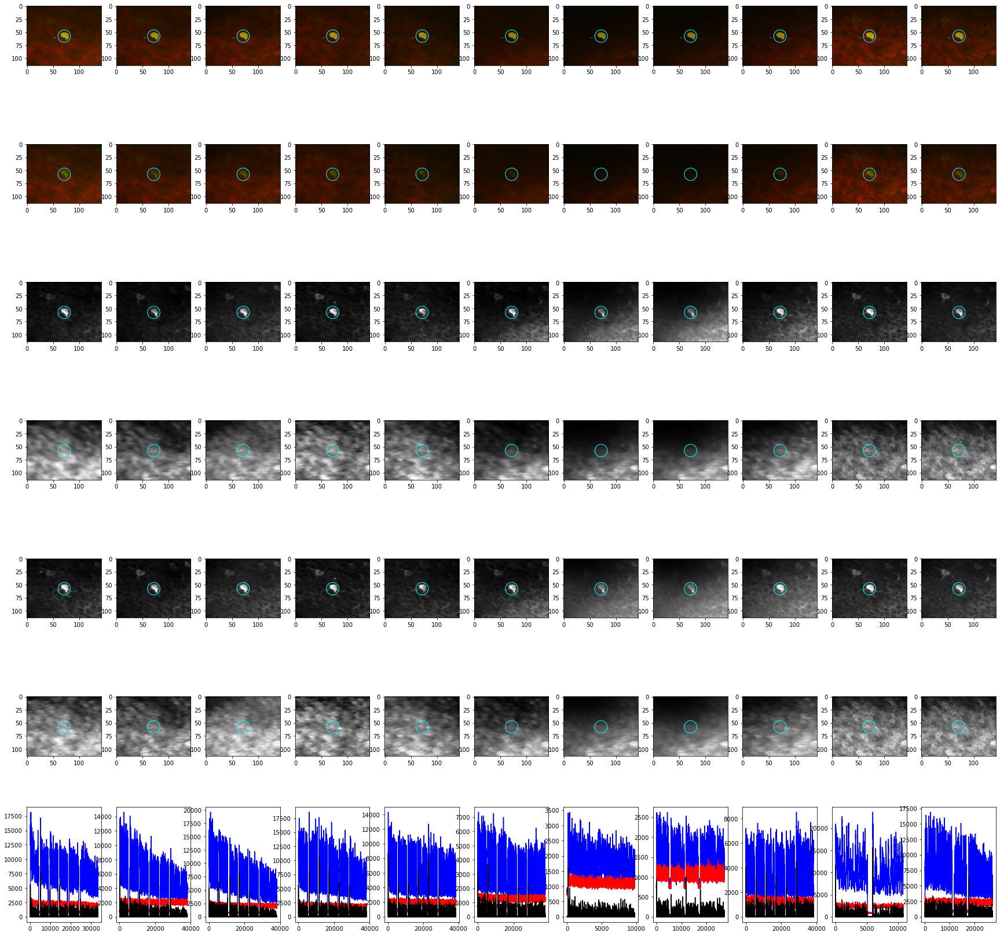

Keep ROI 28 of 527? (y=1/n=0) 0


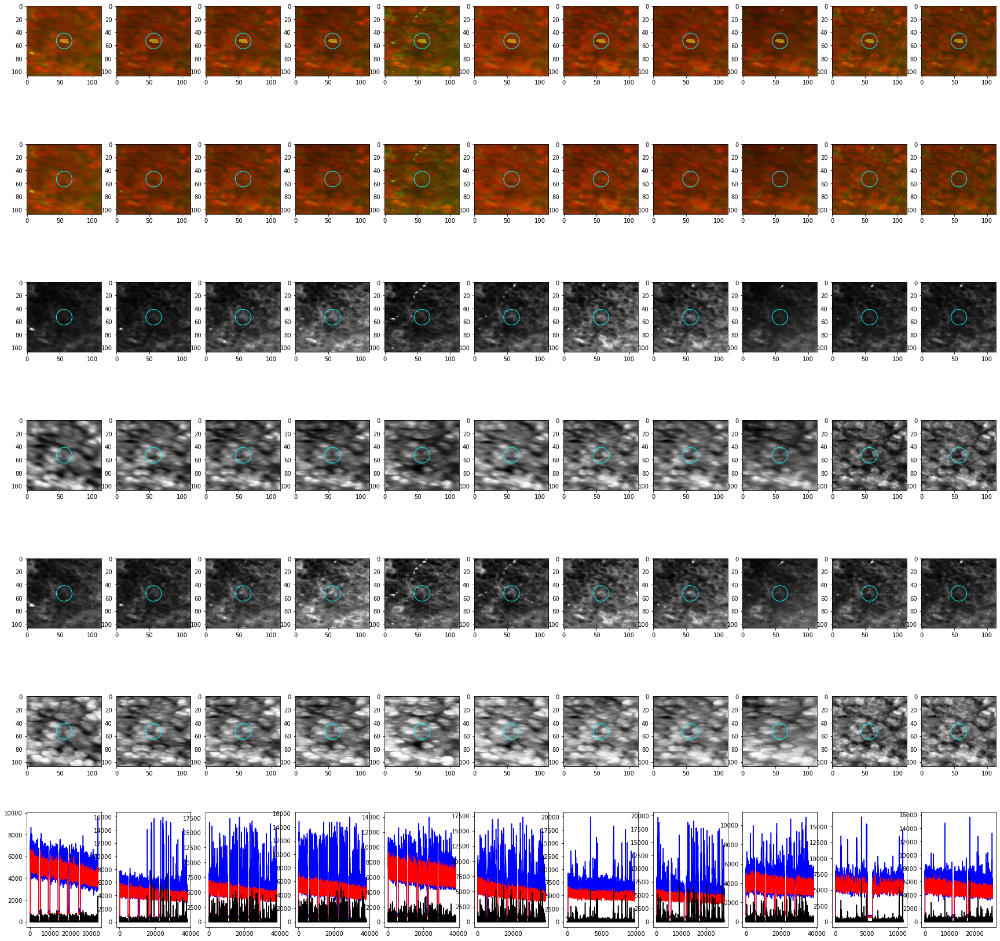

Keep ROI 29 of 527? (y=1/n=0) 0


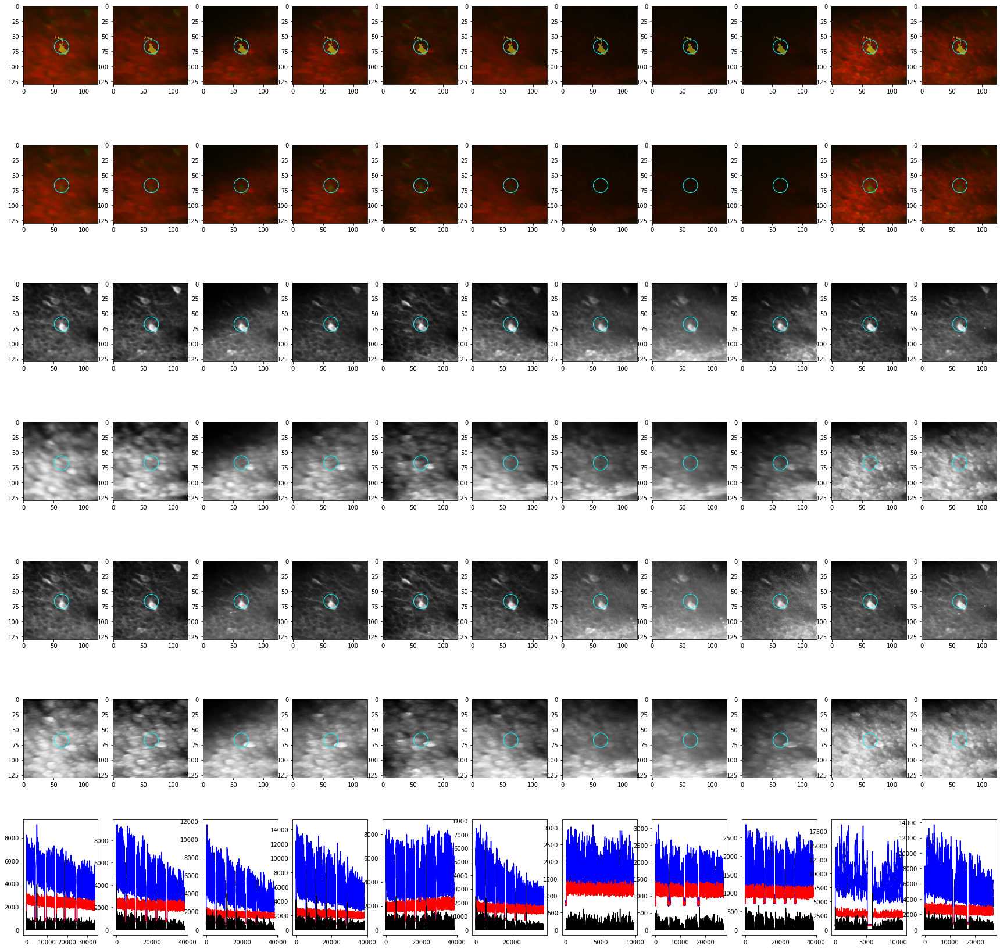

Keep ROI 30 of 527? (y=1/n=0) 0


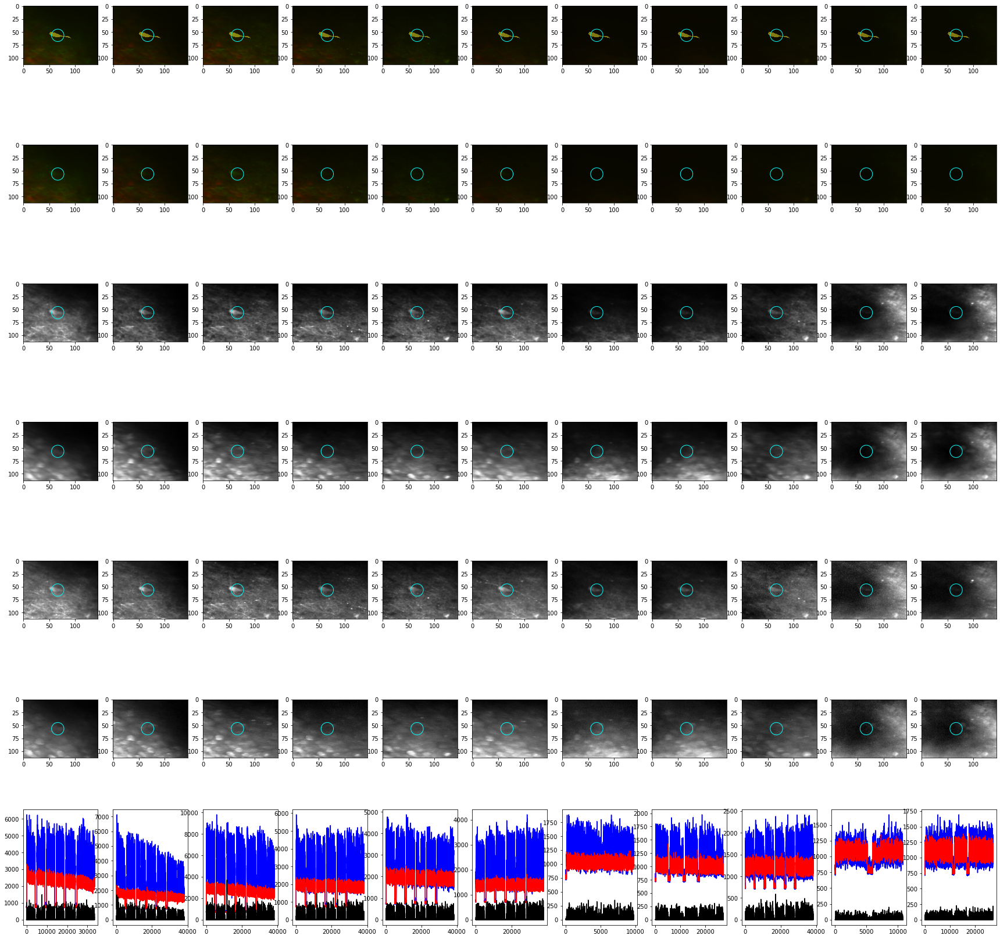

Keep ROI 31 of 527? (y=1/n=0) 0


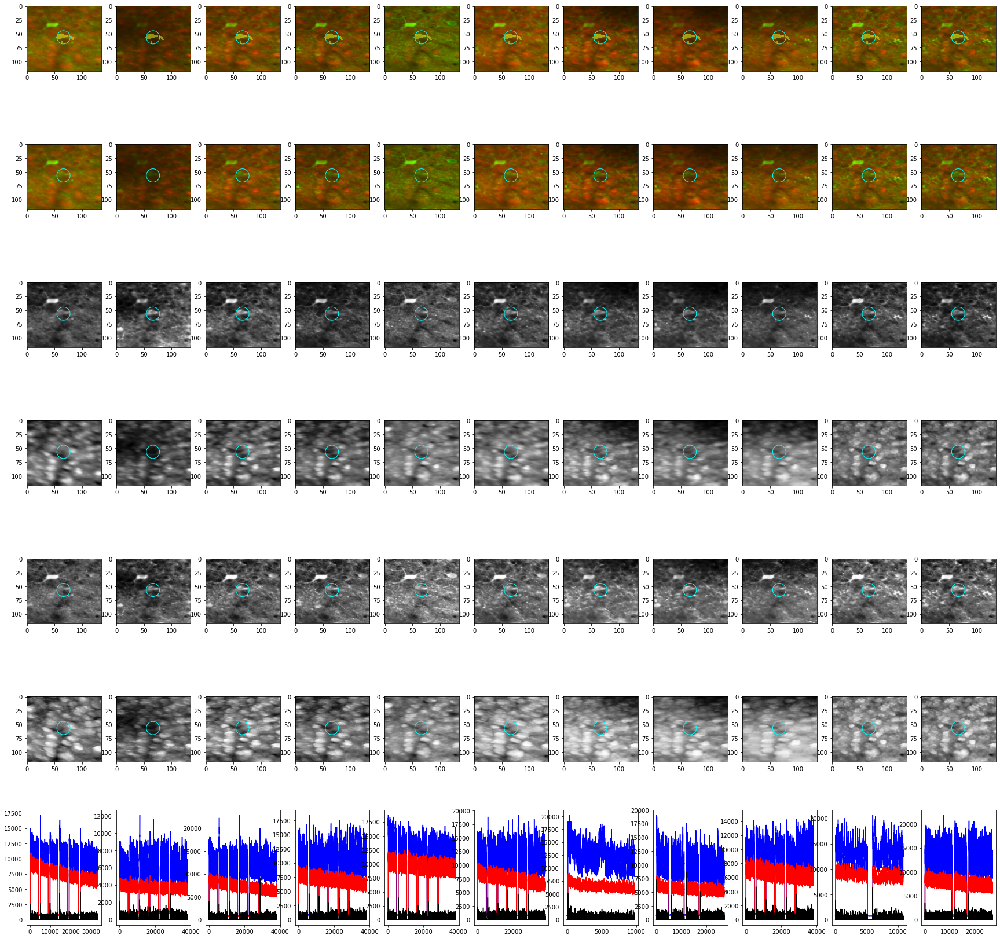

KeyboardInterrupt: Interrupted by user

In [23]:
# for each roi
keep_list= np.load(os.path.join(s2p_dir,"keep.npy"))
for roi_n in range(stat.shape[0]):
    
    if keep_list[roi_n,1]==0:
        roi = stat[roi_n]

        ybounds = (max(0,np.amin(roi['ypix'])-50), min(512, np.amax(roi['ypix'])+50))
        xbounds = (max(0,np.amin(roi['xpix'])-50), min(796, np.amax(roi['xpix'])+50))


        roi_im = np.zeros((ops['Ly'], ops['Lx']))
        roi_im[:]=np.nan
        roi_im[roi['ypix'],roi['xpix']] = 1

        center = (roi['xpix'].mean()-xbounds[0],roi['ypix'].mean() - ybounds[0])


        f = plt.figure(figsize=[30,30])
        gs = gridspec.GridSpec(7,len(file_list))


        #
        for i, file in enumerate(file_list):
            mean,maxproj,mean_chan2,maxproj_chan2 = file['mean'],file['maxproj'],file['mean_chan2'],file['maxproj_chan2']

            color_img = np.zeros([*mean.shape,3])
            color_img[:,:,0]=mean_chan2/np.amax(mean_chan2)
            color_img[:,:,1]=mean/np.amax(mean)


            ax = f.add_subplot(gs[0,i])
            ax.imshow(color_img[slice(*ybounds),slice(*xbounds),:])
            ax.imshow(roi_im[slice(*ybounds),slice(*xbounds)],alpha=.5,vmax=1,vmin=0)
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)

            ax = f.add_subplot(gs[1,i])
            ax.imshow(color_img[slice(*ybounds),slice(*xbounds),:])
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)

            ax = f.add_subplot(gs[2,i])
            ax.imshow(mean[slice(*ybounds),slice(*xbounds)],cmap="Greys_r")
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)



            #
            ax = f.add_subplot(gs[3,i])
            ax.imshow(mean_chan2[slice(*ybounds),slice(*xbounds)],cmap="Greys_r")
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)

            #
            ax = f.add_subplot(gs[4,i])
            ax.imshow(maxproj[slice(*ybounds),slice(*xbounds)],cmap="Greys_r")
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)


            #
            ax = f.add_subplot(gs[5,i])
            ax.imshow(maxproj_chan2[slice(*ybounds),slice(*xbounds)],cmap="Greys_r")
            circle = plt.Circle(center,12, fill=False,color='cyan')
            ax.add_artist(circle)


            ax = f.add_subplot(gs[6,i])
            ax.plot(F[roi_n,file['start_index']:file['stop_index']],color='blue')
            ax.plot(Fneu[roi_n,file['start_index']:file['stop_index']],color='red')
            ax.plot(spks[roi_n,file['start_index']:file['stop_index']],color='black')

        plt.show(block=False)
    #     f.canvas.draw()
    #     f.canvas.flush_events()
        keep = get_input(roi_n,stat.shape[0])
        keep_list[roi_n,0]=keep
        keep_list[roi_n,1]=1
        np.save(os.path.join(s2p_dir,"keep.npy"),keep_list)
        
        plt.close(f)